In [14]:
!pip install opendatasets --upgrade --quiet

In [15]:
project_name= 'gan-anime-faces'

## Downloading the dataset

In the dataset we have the anime faces which we will use to generate the fake anime faces

**Dataset link**

https://www.kaggle.com/splcher/animefacedataset

You can download the dataset if you want to work on this dataset

In [16]:
# Downloading the dataset from the kaggle (anime faces dataset)
import opendatasets as od

dataset_url= 'https://www.kaggle.com/splcher/animefacedataset'
od.download(dataset_url)

Skipping, found downloaded files in "./animefacedataset" (use force=True to force download)


In [17]:
# Saving the working directory
import os

data_dir= './animefacedataset'
print(os.listdir(data_dir))

['images']


In [18]:
# checking the element of the directory
print(os.listdir(data_dir+'/images')[:20])

['6517_2003.jpg', '53622_2016.jpg', '61760_2018.jpg', '26873_2009.jpg', '33066_2011.jpg', '35482_2011.jpg', '17489_2007.jpg', '10974_2005.jpg', '55096_2016.jpg', '61600_2018.jpg', '49445_2015.jpg', '49797_2015.jpg', '43782_2013.jpg', '42_2000.jpg', '35208_2011.jpg', '887_2000.jpg', '17462_2007.jpg', '46585_2014.jpg', '9081_2004.jpg', '47390_2014.jpg']


In [19]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [20]:
# Importing some necessary library
from torchvision import transforms as tt
import torchvision
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

In [21]:
# To perform the normalization of the images and the size of the image need for the model
stats= (0.5,0.5,0.5), (0.5,0.5,0.5)
batch_size= 130
image_size= 64

## PreProcessing

Normalizing the data and performing the transformation

Resize - To resize the image of the images_size

CerterCrop - To crop the image from the centre

In [23]:
train_data= ImageFolder(data_dir, transform= tt.Compose([
                                                         tt.Resize(image_size),
                                                         tt.CenterCrop(image_size),
                                                         tt.ToTensor(),
                                                         tt.Normalize(*stats)]))

In [24]:
train_loader= DataLoader(train_data, batch_size, shuffle= True, pin_memory=True, num_workers=3)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [25]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Function to Denormalize the images
def denorm(image):
  return image * stats[1][0] + stats[0][1]

# Function to make the grid of the batch image
def show_grid(image, num_image= 70):
    fig,ax= plt.subplots(figsize= (15,15))
    ax.set_xticks([]), ax.set_yticks([])
    ax.imshow(make_grid(denorm(image.detach()[:num_image]), nrow= 10).permute(1,2,0))

def show_batch(batch, num_images= 60):
  for image, _ in batch:
     show_grid(image, num_images)
     break

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


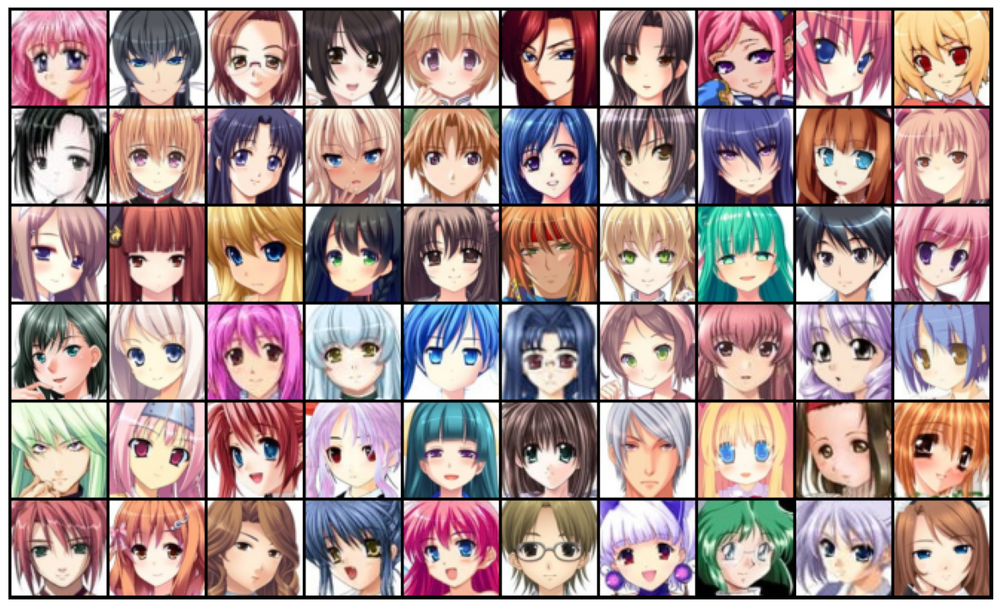

In [26]:
# Let see the image from the dataset
show_batch(train_loader)

# Using GPUs

These are some function which help me to use GPU for the porcessing and to shift the data as well

In [27]:
import torch

In [28]:
def get_device():
  if torch.cuda.is_available:
    return ('cuda')
  else:
    return ('cpu')

def to_device(data, device):
  if isinstance(data, (tuple, list)):
    return [to_device(x, device) for x in data]
  return data.to(device, non_blocking= True)

class DeviceDataLoader():
  def __init__(self, batch,device):
    self.dl= batch
    self.device= device

  def __iter__(self):
    for b in self.dl:
      yield to_device (b, self.device)

  def __len__(self):
    return len(self.dl)

In [29]:
torch.cuda.empty_cache()

# Discriminator Network
Used to predict wheather images is belong to dataset or generated by the image

Or just classify the image for between real image or the fake image

In [30]:
import torch.nn as nn

In [31]:
# Creating the discriminator variable
discriminator = nn.Sequential(
    nn.Conv2d(3, 64, kernel_size= 4, padding= 1, stride= 2, bias= False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace= True),

    nn.Conv2d(64,128, kernel_size=4, stride= 2, padding= 1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace= True),

    nn.Conv2d(128,256, kernel_size= 4, stride= 2, padding= 1, bias= False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace= True),

    nn.Conv2d(256,512, kernel_size= 4, stride= 2, padding= 1, bias= False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace= True),

    nn.Conv2d(512, 1, kernel_size= 4, stride= 1, padding= 0, bias= False),

    nn.Flatten(),
    nn.Sigmoid()
)

# Generator network
Used to generate the fake image on the basis of fake image

In [45]:
latent_size= 128

In [46]:
# Creating the Generator network
generator= nn.Sequential(
    nn.ConvTranspose2d(latent_size, 512, kernel_size= 4, padding=0, stride= 1, bias= False),
    nn.BatchNorm2d(512),
    nn.ReLU(inplace= True),

    nn.ConvTranspose2d(512, 256, kernel_size= 4, padding=1, stride= 2, bias= False),
    nn.BatchNorm2d(256),
    nn.ReLU(inplace= True),

    nn.ConvTranspose2d(256, 156, kernel_size= 4, padding=1, stride= 2, bias= False),
    nn.BatchNorm2d(156),
    nn.ReLU(inplace= True),

    nn.ConvTranspose2d(156, 64,kernel_size= 4, padding=1, stride= 2, bias= False),
    nn.BatchNorm2d(64),
    nn.ReLU(inplace= True),

    nn.ConvTranspose2d(64, 3, kernel_size=4, padding= 1, stride= 2, bias= False),
    nn.Tanh()
)

In [47]:
# Getting the avialabel device for the workspace
device= get_device()
device

'cuda'

In [48]:
# moving the dataloader on device
train_loader= DeviceDataLoader(train_loader, device)

torch.Size([130, 3, 64, 64])


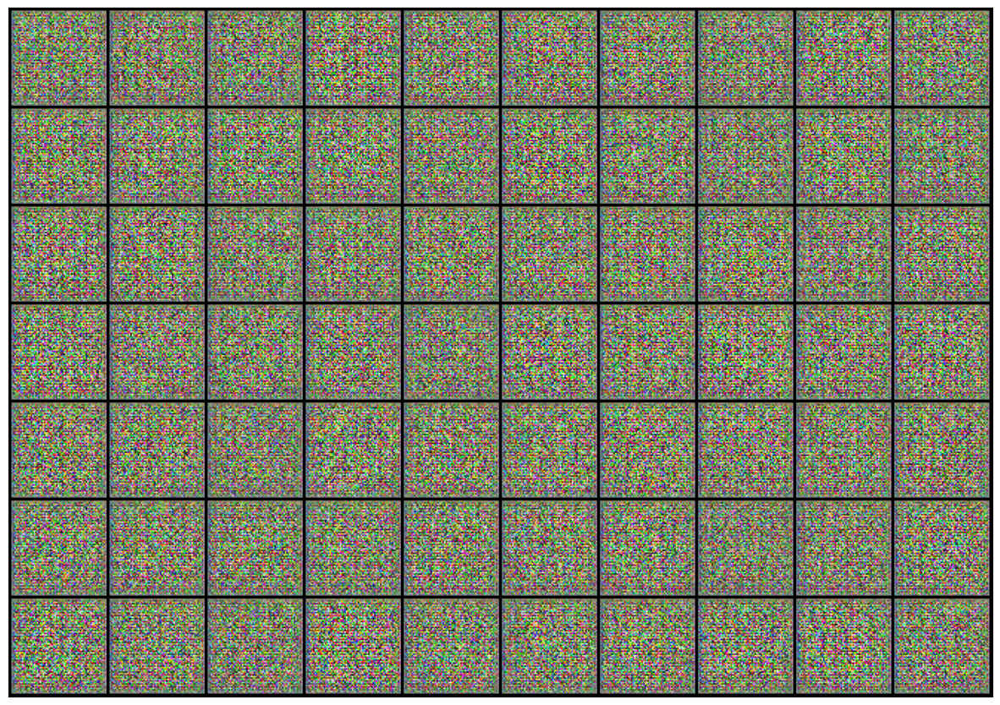

In [49]:
# This is image formed using random numbers
xb= torch.randn(batch_size, latent_size, 1, 1)
fake_image= generator(xb)
show_grid(fake_image)
print(fake_image.shape)

In [50]:
# Moving the discrminator and genertor function on the device
to_device(discriminator, device)
to_device(generator, device)

Sequential(
  (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
  (6): ConvTranspose2d(256, 156, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (7): BatchNorm2d(156, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU(inplace=True)
  (9): ConvTranspose2d(156, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): ReLU(inplace=True)
  (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (13): Tanh()
)

# Training Discrminator and generator

Loop For the number of epochs to train the discrminator as well as generator

In [51]:
import torch.functional as F

In [52]:
def train_discrminator(images, opt_d):
  opt_d.zero_grad()

  # Passing the real image and label for real image is 1
  real_preds= discriminator(images)
  real_target= torch.ones(images.size(0), 1, device= device)
  real_loss= F.binary_cross_entropy(real_preds, real_target)
  real_score= torch.mean(real_loss).item()

  # Generating the fake images
  latent= torch.randn(batch_size, latent_size, 1, 1, device= device)
  fake_image= generator(latent)

  # Passing the fake image and label is 0
  fake_target= torch.zeros(fake_image.size(0), 1, device= device)
  fake_preds= discriminator(fake_image)
  fake_loss= F.binary_cross_entropy(fake_preds, fake_target)
  fake_score= torch.mean(fake_loss).item()

  # Total loss of discrminator and increase the accuracy of the model
  loss= fake_loss + real_loss
  loss.backward()
  opt_d.step()

  return loss.item(), real_score, fake_score

In [53]:
def train_generator(opt_g):
  opt_g.zero_grad()

  # Creating the vector to generate the images
  latent= torch.randn(batch_size, latent_size, 1, 1, device= device)
  fake_image= generator(latent)

  # Taking prediction and setting the label as 1 (as we want real images from the genertor)
  pred= discriminator(fake_image)
  target= torch.ones(batch_size, 1, device= device)
  loss= F.binary_cross_entropy(pred, target)

  loss.backward()
  opt_g.step()

  return loss.item()

In [54]:
# Creating the directory to store the progress of the model
sample_dir= 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [55]:
# Saving the images and plot them
from torchvision.utils import save_image

def saving_image(index, latent_tensor, show= True):
  fake_image= generator(latent_tensor)
  fake_name= 'generated-image-{0:0=4d}.png'.format(index)
  save_image(denorm(fake_image), os.path.join(sample_dir, fake_name), nrow= 10)
  print('Saving', fake_name)
  if show:
    fig, ax= plt.subplots(figsize= (12,12))
    ax.set_xticks([]), ax.set_yticks([])
    plt.imshow(make_grid(fake_image.cpu().detach(), nrow= 10).permute(1,2,0))

In [56]:
# This fixed_latent is used to see the progress of the model
fixed_latent= torch.randn(batch_size, 128, 1, 1, device= device)

Saving generated-image-0000.png


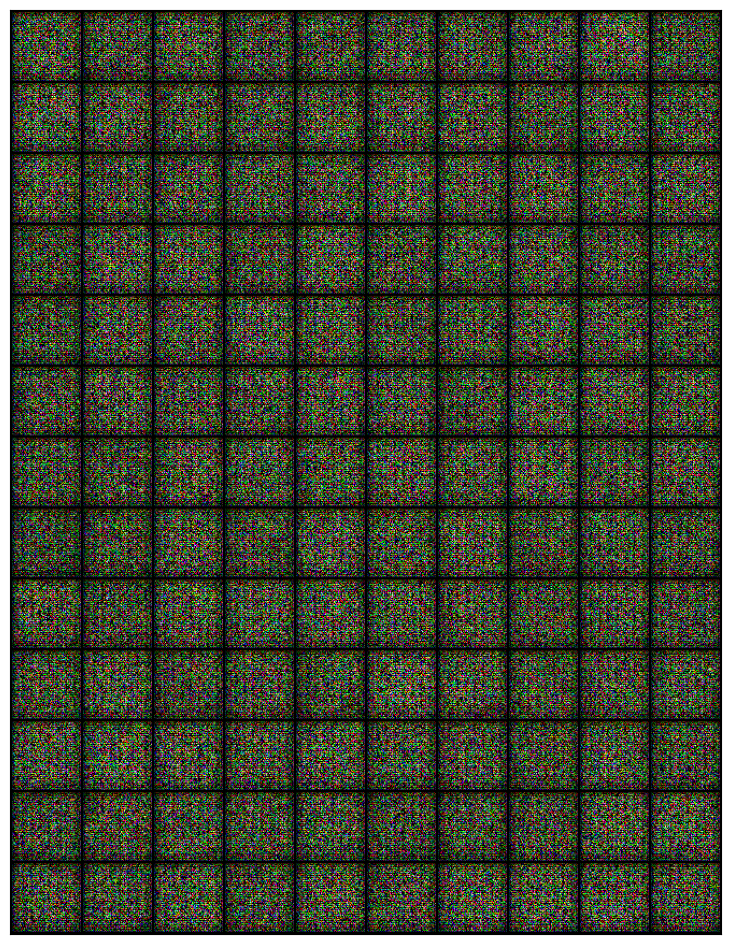

In [57]:
# Now saving the image produce by this fixed_latent vector
saving_image(0, fixed_latent)

# Full training loop for the model
Fit method which iterate the train generator and discrimniator method to train the model

And help to generate the fake images which look a like real one

In [58]:
import torch.nn.functional as F
from tqdm.notebook import tqdm

In [59]:
def fit(epochs, lr, idx=1):

  torch.cuda.empty_cache()

  # To record the losses
  losses_g= []
  losses_d= []
  fake_score= []
  real_score= []

  opt_g= torch.optim.Adam(generator.parameters(), lr, betas=(0.5, 0.996))
  opt_d= torch.optim.Adam(discriminator.parameters(), lr, betas=(0.5, 0.996))

  for epoch in range(epochs):

    for real_image, _ in tqdm(train_loader):
      loss_d, real_s, fake_s= train_discrminator(real_image, opt_d)
      loss_g= train_generator(opt_g)

    losses_g.append(loss_g)
    losses_d.append(loss_d)
    real_score.append(real_s)
    fake_score.append(fake_s)

    print('Epochs: [{}], loss_gen: {:.4f}, loss_dis: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}'.format(epoch, loss_g, loss_d, real_s, fake_s))

    saving_image(idx+epoch, fixed_latent, show= False)

  return losses_g, losses_d, real_score, fake_score

In [60]:
# Defining hpyerparameteres
lr= 0.0001
epochs= 25

In [61]:
%%time
history= fit(epochs, lr)

  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [0], loss_gen: 7.2621, loss_dis: 0.4724, real_score: 0.0237, fake_score: 0.4486
Saving generated-image-0001.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [1], loss_gen: 2.7173, loss_dis: 0.5002, real_score: 0.4788, fake_score: 0.0214
Saving generated-image-0002.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [2], loss_gen: 4.0550, loss_dis: 0.2703, real_score: 0.1311, fake_score: 0.1393
Saving generated-image-0003.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [3], loss_gen: 4.5297, loss_dis: 0.1337, real_score: 0.0643, fake_score: 0.0694
Saving generated-image-0004.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [4], loss_gen: 4.6056, loss_dis: 0.1798, real_score: 0.0579, fake_score: 0.1219
Saving generated-image-0005.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [5], loss_gen: 4.6375, loss_dis: 0.1140, real_score: 0.0547, fake_score: 0.0593
Saving generated-image-0006.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [6], loss_gen: 13.3075, loss_dis: 1.9620, real_score: 0.0002, fake_score: 1.9618
Saving generated-image-0007.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [7], loss_gen: 3.4290, loss_dis: 0.1931, real_score: 0.1238, fake_score: 0.0693
Saving generated-image-0008.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [8], loss_gen: 3.7436, loss_dis: 0.1746, real_score: 0.1499, fake_score: 0.0246
Saving generated-image-0009.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [9], loss_gen: 6.4864, loss_dis: 0.1292, real_score: 0.0202, fake_score: 0.1090
Saving generated-image-0010.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [10], loss_gen: 5.0948, loss_dis: 0.0973, real_score: 0.0722, fake_score: 0.0252
Saving generated-image-0011.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [11], loss_gen: 4.6352, loss_dis: 0.1074, real_score: 0.0450, fake_score: 0.0624
Saving generated-image-0012.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [12], loss_gen: 4.7961, loss_dis: 0.0934, real_score: 0.0457, fake_score: 0.0477
Saving generated-image-0013.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [13], loss_gen: 5.2561, loss_dis: 0.0599, real_score: 0.0471, fake_score: 0.0128
Saving generated-image-0014.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [14], loss_gen: 4.9804, loss_dis: 0.1215, real_score: 0.0575, fake_score: 0.0640
Saving generated-image-0015.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [15], loss_gen: 2.9879, loss_dis: 0.1747, real_score: 0.1641, fake_score: 0.0106
Saving generated-image-0016.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [16], loss_gen: 4.6379, loss_dis: 0.0797, real_score: 0.0242, fake_score: 0.0554
Saving generated-image-0017.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [17], loss_gen: 3.9974, loss_dis: 0.1571, real_score: 0.1385, fake_score: 0.0186
Saving generated-image-0018.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [18], loss_gen: 4.3970, loss_dis: 0.0851, real_score: 0.0208, fake_score: 0.0643
Saving generated-image-0019.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [19], loss_gen: 5.1820, loss_dis: 0.0914, real_score: 0.0759, fake_score: 0.0154
Saving generated-image-0020.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [20], loss_gen: 10.3141, loss_dis: 0.6046, real_score: 0.0013, fake_score: 0.6033
Saving generated-image-0021.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [21], loss_gen: 6.3577, loss_dis: 0.1769, real_score: 0.0257, fake_score: 0.1512
Saving generated-image-0022.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [22], loss_gen: 4.4924, loss_dis: 0.0658, real_score: 0.0462, fake_score: 0.0196
Saving generated-image-0023.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [23], loss_gen: 4.5916, loss_dis: 0.0981, real_score: 0.0493, fake_score: 0.0488
Saving generated-image-0024.png


  0%|          | 0/489 [00:00<?, ?it/s]

Epochs: [24], loss_gen: 5.3437, loss_dis: 0.0923, real_score: 0.0346, fake_score: 0.0577
Saving generated-image-0025.png
CPU times: user 56min 16s, sys: 1min 3s, total: 57min 20s
Wall time: 1h 4min 48s


In [62]:
losses_g, losses_d, real_score, fake_score= history

In [63]:
history

([7.262144565582275,
  2.717320442199707,
  4.055046081542969,
  4.52972412109375,
  4.605576515197754,
  4.637511253356934,
  13.307509422302246,
  3.429025888442993,
  3.7436470985412598,
  6.4863762855529785,
  5.094817638397217,
  4.635217189788818,
  4.7960524559021,
  5.25613260269165,
  4.980367183685303,
  2.98785400390625,
  4.637948513031006,
  3.997422456741333,
  4.396966934204102,
  5.182034015655518,
  10.314064025878906,
  6.35770845413208,
  4.49238920211792,
  4.591641426086426,
  5.343708515167236],
 [0.4723561406135559,
  0.5002094507217407,
  0.27034294605255127,
  0.13371968269348145,
  0.17979592084884644,
  0.11400297284126282,
  1.9619734287261963,
  0.1931469738483429,
  0.1745566874742508,
  0.1292385756969452,
  0.09734737873077393,
  0.10741618275642395,
  0.09339705109596252,
  0.05990941449999809,
  0.12147082388401031,
  0.17468959093093872,
  0.07965154200792313,
  0.1571165770292282,
  0.08512742817401886,
  0.09138026833534241,
  0.6045717000961304,
  

In [64]:
# Saving the weight of the model
torch.save(generator.state_dict, 'Generator.pth')
torch.save(discriminator.state_dict, 'Discrminator.pth')

Saving generated-image-0041.png


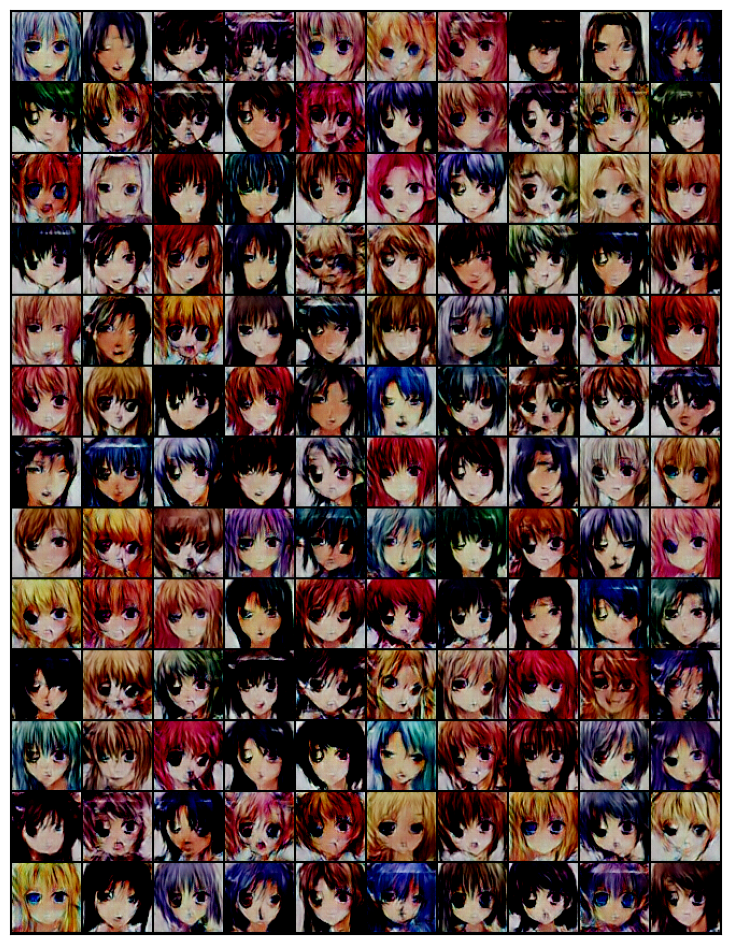

In [65]:
saving_image(41, fixed_latent)

# Creating the video so we can see the progress of the model
For this i am using CV2 library to create the video

In [66]:

import matplotlib.pyplot as plt


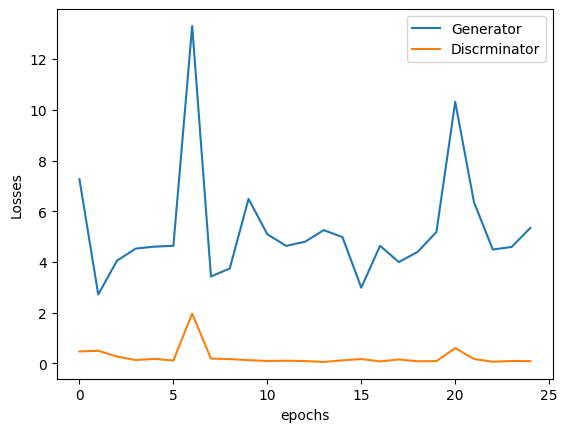

In [67]:
# Plotting the losses of the generator and the discrminator
plt.plot(losses_g)
plt.plot(losses_d)
plt.xlabel('epochs')
plt.ylabel('Losses')
plt.legend(['Generator', 'Discrminator'])

Text(0, 0.5, 'Real_score')

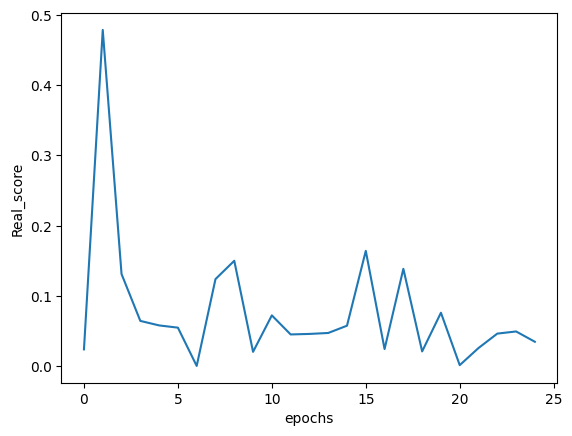

In [68]:
# Plotting the real_score of the model
plt.plot(real_score)
plt.xlabel('epochs')
plt.ylabel('Real_score')

Text(0, 0.5, 'Real_score')

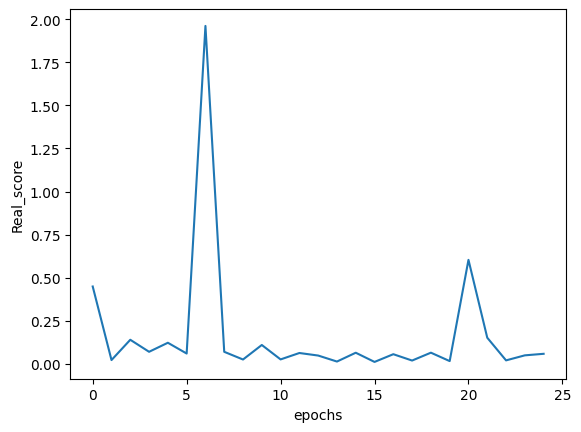

In [69]:
# Plotting the fake_score of the model
plt.plot(fake_score)
plt.xlabel('epochs')
plt.ylabel('Real_score')